In [9]:
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt

pd.set_option('display.max_column', None)

data_path = './../data/nba_logreg.csv'
df = pd.read_csv(data_path)

In [10]:
df

,Name,GP,MIN,PTS,FGM,FGA,FG%,3P Made,3PA,3P%,FTM,FTA,FT%,OREB,DREB,REB,AST,STL,BLK,TOV,TARGET_5Yrs
0,Brandon Ingram,36,27.4,7.4,2.6,7.6,34.7,0.5,2.1,25.0,1.6,2.3,69.9,0.7,3.4,4.1,1.9,0.4,0.4,1.3,0.0
1,Andrew Harrison,35,26.9,7.2,2.0,6.7,29.6,0.7,2.8,23.5,2.6,3.4,76.5,0.5,2.0,2.4,3.7,1.1,0.5,1.6,0.0
2,JaKarr Sampson,74,15.3,5.2,2.0,4.7,42.2,0.4,1.7,24.4,0.9,1.3,67.0,0.5,1.7,2.2,1.0,0.5,0.3,1.0,0.0
3,Malik Sealy,58,11.6,5.7,2.3,5.5,42.6,0.1,0.5,22.6,0.9,1.3,68.9,1.0,0.9,1.9,0.8,0.6,0.1,1.0,1.0
4,Matt Geiger,48,11.5,4.5,1.6,3.0,52.4,0.0,0.1,0.0,1.3,1.9,67.4,1.0,1.5,2.5,0.3,0.3,0.4,0.8,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1335,Chris Smith,80,15.8,4.3,1.6,3.6,43.3,0.0,0.2,14.3,1.2,1.5,79.2,0.4,0.8,1.2,2.5,0.6,0.2,0.8,0.0
1336,Brent Price,68,12.6,3.9,1.5,4.1,35.8,0.1,0.7,16.7,0.8,1.0,79.4,0.4,1.1,1.5,2.3,0.8,0.0,1.3,1.0
1337,Marlon Maxey,43,12.1,5.4,2.2,3.9,55.0,0.0,0.0,0.0,1.0,1.6,64.3,1.5,2.3,3.8,0.3,0.3,0.4,0.9,0.0
1338,Litterial Green,52,12.0,4.5,1.7,3.8,43.9,0.0,0.2,10.0,1.2,1.8,62.5,0.2,0.4,0.7,2.2,0.4,0.1,0.8,1.0


In [12]:
df.dtypes.value_counts()

float64    19
object      1
int64       1
Name: count, dtype: int64

<Axes: >

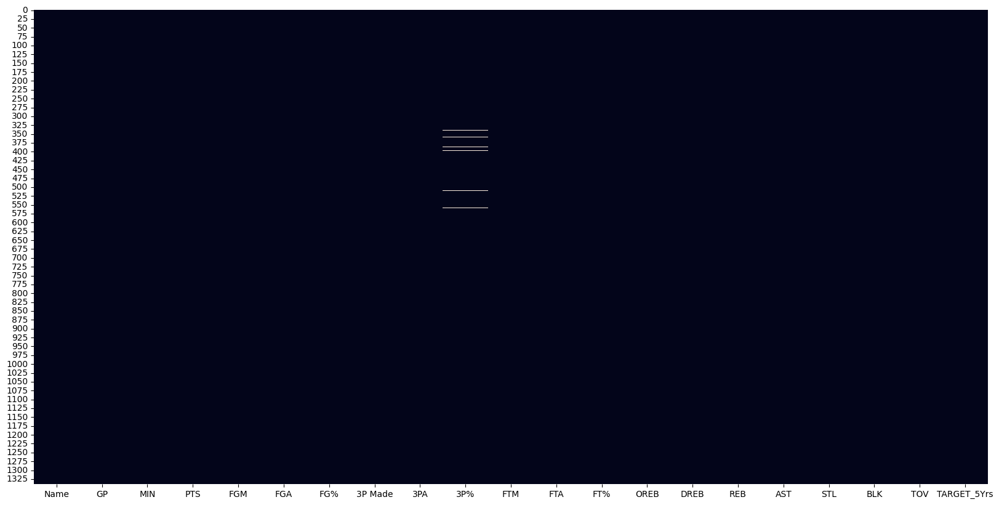

In [13]:
plt.figure(figsize=(20,10))
sns.heatmap(df.isna(), cbar=False)

In [15]:
(df.isna().sum()).sort_values(ascending=True)

Name            0
BLK             0
STL             0
AST             0
REB             0
               ..
PTS             0
MIN             0
GP              0
TARGET_5Yrs     0
3P%            11
Length: 21, dtype: int64

In [16]:
df[df['3P%'].isnull()]

,Name,GP,MIN,PTS,FGM,FGA,FG%,3P Made,3PA,3P%,FTM,FTA,FT%,OREB,DREB,REB,AST,STL,BLK,TOV,TARGET_5Yrs
338,Ken Johnson,64,12.7,4.1,1.8,3.3,52.8,0.0,0.0,NaN,0.6,1.3,43.5,1.4,2.4,3.8,0.3,0.2,0.3,0.9,0.0
339,Ken Johnson,64,12.7,4.1,1.8,3.3,52.8,0.0,0.0,NaN,0.6,1.3,43.5,1.4,2.4,3.8,0.3,0.2,0.3,0.9,0.0
340,Pete Williams,53,10.8,2.8,1.3,2.1,60.4,0.0,0.0,NaN,0.3,0.8,42.5,0.9,1.9,2.8,0.3,0.4,0.4,0.4,0.0
358,Melvin Turpin,79,24.7,10.6,4.6,9.0,51.1,0.0,0.0,NaN,1.4,1.8,78.4,2.0,3.8,5.7,0.5,0.5,1.1,1.5,1.0
386,Jim Petersen,60,11.9,3.2,1.2,2.4,48.6,0.0,0.0,NaN,0.8,1.1,75.8,0.7,1.7,2.5,0.5,0.2,0.5,1.2,1.0
397,Tom Scheffler,39,6.9,1.3,0.5,1.3,41.2,0.0,0.0,NaN,0.3,0.5,50.0,0.5,1.5,1.9,0.3,0.2,0.3,0.4,0.0
507,Sam Williams,59,18.2,6.1,2.6,4.7,55.6,0.0,0.0,NaN,0.8,1.5,55.1,1.5,3.7,5.2,0.6,0.8,1.3,1.1,0.0
509,Kurt Nimphius,63,17.2,5.3,2.2,4.7,46.1,0.0,0.0,NaN,1.0,1.7,58.3,1.5,3.2,4.7,1.0,0.3,1.3,0.9,1.0
510,Pete Verhoeven,71,17.0,4.9,2.1,4.2,50.3,0.0,0.0,NaN,0.7,1.0,70.8,1.5,2.1,3.6,0.7,0.6,0.3,0.8,1.0
521,Jim Smith,72,11.9,2.9,1.2,2.3,50.9,0.0,0.0,NaN,0.5,1.2,45.9,1.0,1.5,2.5,0.6,0.3,0.7,0.7,0.0


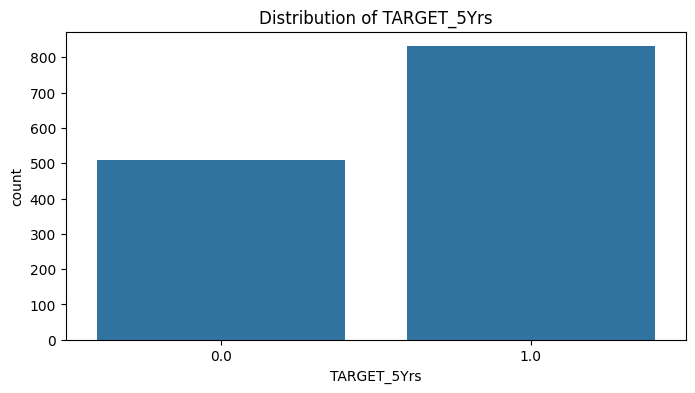

distribution of TARGET_5Yrs:
TARGET_5Yrs
1.0    0.620149
0.0    0.379851
Name: proportion, dtype: float64


In [19]:
plt.figure(figsize=(8, 4))
sns.countplot(x='TARGET_5Yrs', data=data)
plt.title('Distribution of TARGET_5Yrs')
plt.show()

distribution = df['TARGET_5Yrs'].value_counts(normalize=True)
print(f'distribution of TARGET_5Yrs:\n{distribution}')

In [24]:
df[df.duplicated(keep=False)].sort_values(by=['Name', 'GP'])

,Name,GP,MIN,PTS,FGM,FGA,FG%,3P Made,3PA,3P%,FTM,FTA,FT%,OREB,DREB,REB,AST,STL,BLK,TOV,TARGET_5Yrs
368,Charles Jones,29,16.4,3.7,1.3,4.2,31.7,0.7,2.1,31.1,0.4,0.8,50.0,0.3,1.1,1.4,1.4,0.6,0.2,1.0,0.0
369,Charles Jones,29,16.4,3.7,1.3,4.2,31.7,0.7,2.1,31.1,0.4,0.8,50.0,0.3,1.1,1.4,1.4,0.6,0.2,1.0,0.0
365,Charles Jones,78,20.1,8.4,3.0,5.8,52.0,0.0,0.1,0.0,2.3,3.6,64.8,1.8,3.3,5.1,1.6,0.6,0.8,1.8,0.0
366,Charles Jones,78,20.1,8.4,3.0,5.8,52.0,0.0,0.1,0.0,2.3,3.6,64.8,1.8,3.3,5.1,1.6,0.6,0.8,1.8,0.0
168,Charles Smith,34,8.6,3.5,1.4,3.7,39.2,0.4,1.4,31.9,0.2,0.3,54.5,0.4,0.4,0.8,0.6,0.3,0.2,0.8,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
824,Marcus Williams,79,16.6,6.8,2.6,6.7,39.5,0.6,2.1,28.2,0.9,1.1,84.7,0.4,1.7,2.1,3.3,0.4,0.0,1.8,0.0
970,Mike Dunleavy,82,15.9,5.7,2.0,5.1,40.3,0.6,1.8,34.7,1.0,1.2,78.0,0.8,1.8,2.6,1.3,0.7,0.2,1.1,1.0
971,Mike Dunleavy,82,15.9,5.7,2.0,5.1,40.3,0.6,1.8,34.7,1.0,1.2,78.0,0.8,1.8,2.6,1.3,0.7,0.2,1.1,1.0
242,Reggie Williams,35,24.5,10.4,4.3,12.2,35.6,0.4,1.7,22.4,1.4,1.9,72.7,1.6,1.8,3.4,1.7,0.8,0.6,1.8,1.0


In [31]:
print(f'number of lines duplicated: {df.duplicated().sum()}')

number of lines duplicated: 12


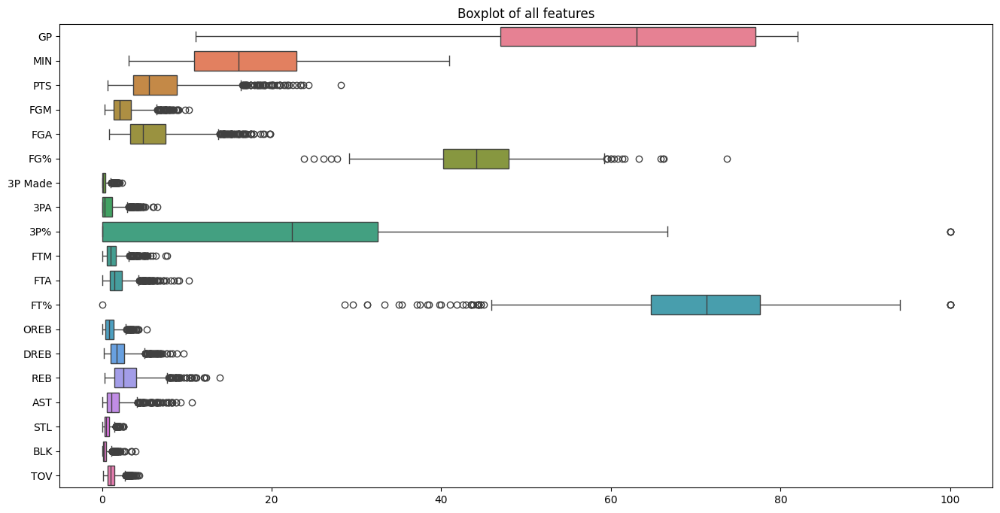

In [59]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df.drop(columns=['Name', 'TARGET_5Yrs']), orient='h')
plt.title('Boxplot of all features')
plt.show()

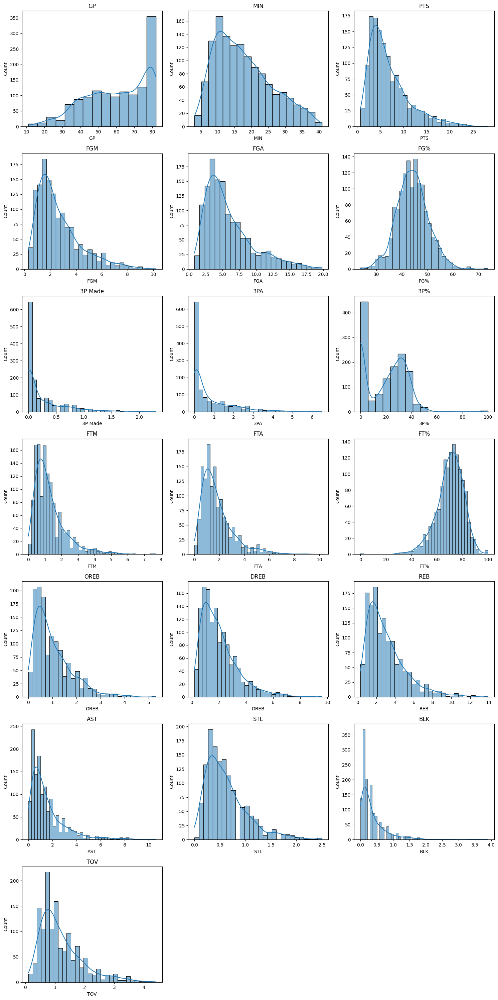

In [35]:
num_cols = 3
num_rows = int(np.ceil((len(df.columns) - 2) / num_cols))

fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 30))

axs = axs.flatten()

for ax, col in zip(axs, df.drop(columns=['Name', 'TARGET_5Yrs']).columns):
    sns.histplot(df[col], kde=True, ax=ax)
    ax.set_title(col)

for ax in axs[len(df.columns) - 2:]:
    ax.remove()

plt.tight_layout()

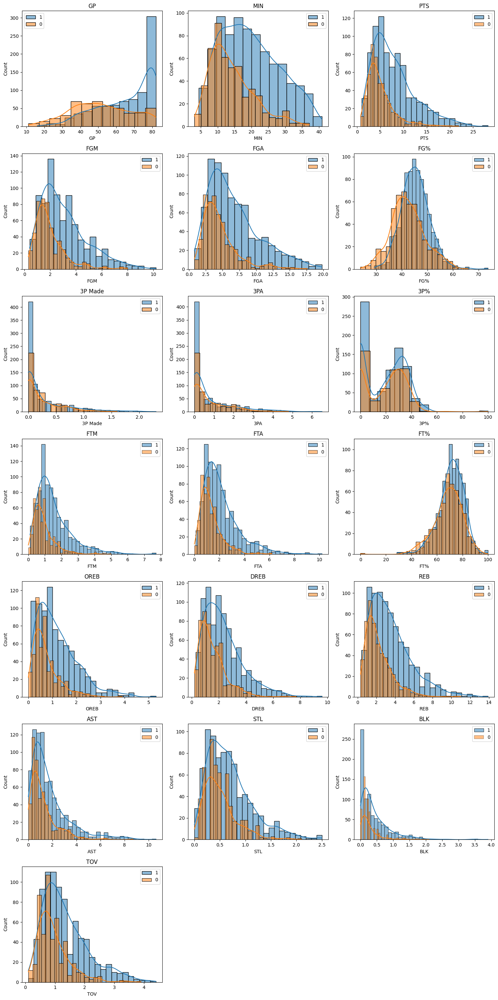

In [49]:
df_1 = df[df['TARGET_5Yrs'] == 1]
df_0 = df[df['TARGET_5Yrs'] == 0]

num_cols = 3
num_rows = int(np.ceil((len(df.columns) - 2) / num_cols))

fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 30))

axs = axs.flatten()

for ax, col in zip(axs, df.drop(columns=['Name', 'TARGET_5Yrs']).columns):
    sns.histplot(df_1[col], kde=True, ax=ax, label='1')
    sns.histplot(df_0[col], kde=True, ax=ax, label='0')
    ax.set_title(col)
    ax.legend()

for ax in axs[len(df.columns) - 2:]:
    ax.remove()

plt.tight_layout()

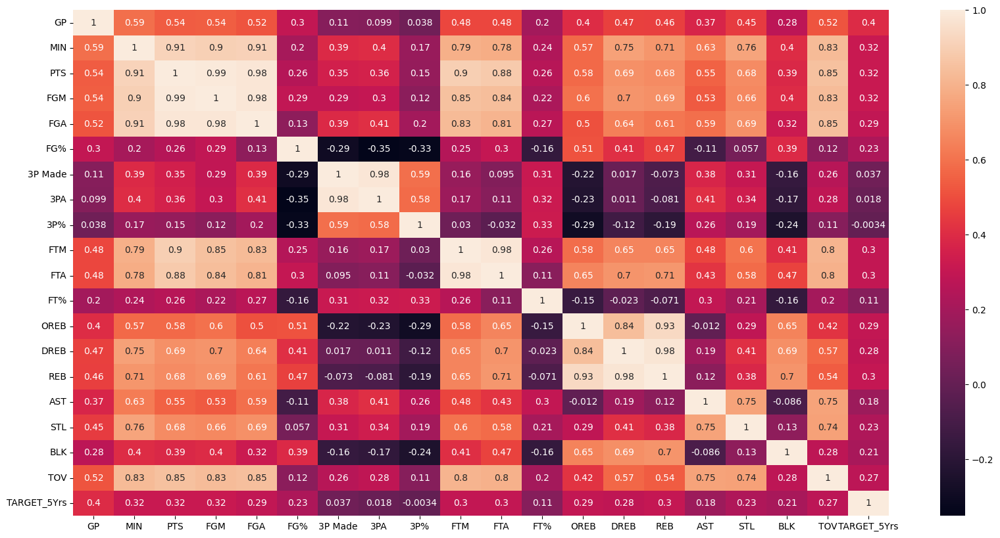

In [55]:
corr = df.drop(columns=['Name']).corr()

plt.figure(figsize=(20, 10))
sns.heatmap(corr, annot=True)
plt.show()


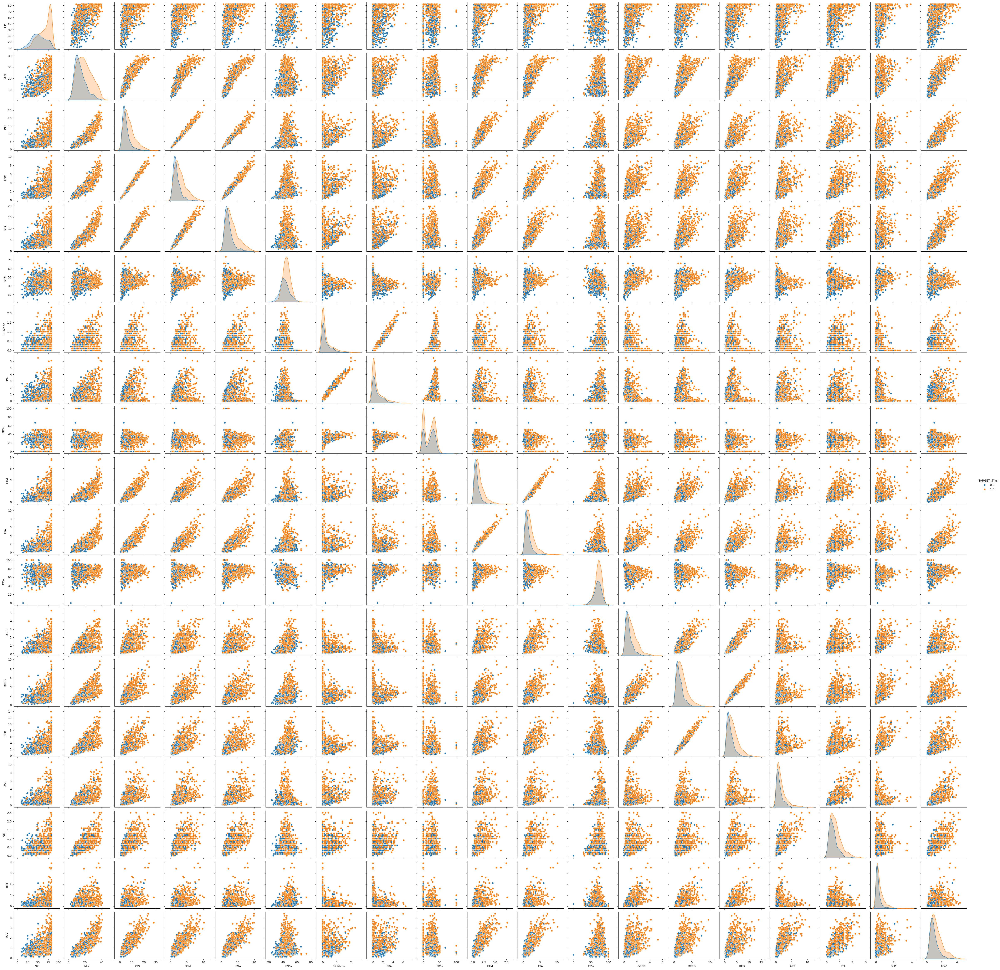

In [50]:
sns.pairplot(df.drop(columns=['Name']), hue='TARGET_5Yrs')

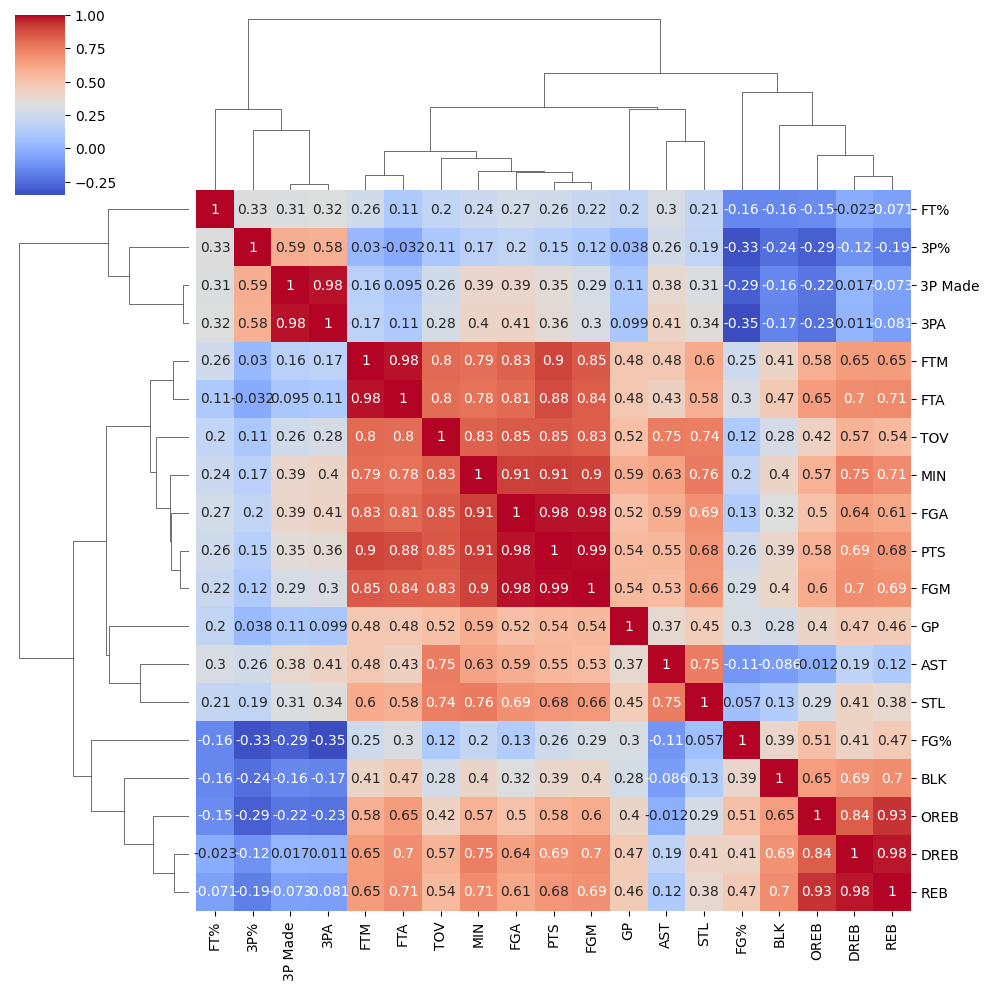

In [51]:
sns.clustermap(df.drop(columns=['Name', 'TARGET_5Yrs']).corr(), cmap='coolwarm', annot=True)